# Introducción

Proyecto entregado en la hackathon HackFromHome2020. Los miembros del proyecto han sido: Samuel Muñoz y Renato Montaño en el Data Mining y Alex Rodríguez y Andreu Huguet en el Análisis de Datos.

# Generación del embedding (Parte I)

## Inicialización de las librerías

Primero de todo, definimos los imports que queramos hacer en el inicio.

In [0]:
import json
import string
import multiprocessing
import pickle
import re

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import gensim
import gensim.models.word2vec as w2v

import nltk
from nltk.corpus import stopwords

from sklearn.manifold import TSNE

Y descargamos toda la información que nos falte.

In [8]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

Después definimos todas las constantes.

In [0]:
stop_words = set(stopwords.words('spanish'))
en_stop_words = set(stopwords.words('english'))

## Lectura de los datos

Ahora ya podemos leer los datos. Empezamos con el *raw* JSON.

In [0]:
with open('elespanol.json', 'r', encoding="utf8") as data:
  json_data = data.read()

Transformamos el JSON en un Data Frame separando por categorías.

In [0]:
parsed_df = pd.read_json(json_data)

Aquí hacemos el *tokenize* del contenido de las noticias.

In [0]:
news_data = parsed_df['contenido']
news_split_data = [re.split('\W+', article) for article in news_data] 

Hacemos una primera visualización del DF para ver que no haya problemas.

In [13]:
print(news_split_data[0])
print(news_split_data[1])
print(news_split_data[2])

['El', 'mundo', 'afronta', 'una', 'pandemia', 'sin', 'precedentes', 'en', 'la', 'que', 'además', 'de', 'ponerse', 'a', 'prueba', 'la', 'fortaleza', 'de', 'los', 'diferentes', 'sistemas', 'de', 'Salud', 'se', 'mide', 'también', 'la', 'madurez', 'de', 'los', 'pueblos', 'Las', 'imágenes', 'que', 'nos', 'llegan', 'de', 'Italia', 'con', 'el', 'ejército', 'transportando', 'muertos', 'de', 'una', 'región', 'a', 'otra', 'para', 'su', 'cremación', 'inmediata', 'reflejan', 'una', 'gran', 'impotencia', 'Decir', 'que', 'esa', 'situación', 'podría', 'darse', 'en', 'España', 'no', 'es', 'ser', 'alarmista', 'La', 'progresión', 'de', 'la', 'enfermedad', 'en', 'nuestro', 'país', 'sigue', 'los', 'derroteros', 'de', 'Italia', 'Allí', 'la', 'mortandad', 'llegó', 'antes', 'y', 'ya', 'superan', 'las', '4', '000', 'víctimas', 'Aquí', 'acabamos', 'de', 'rebasar', 'el', 'millar', 'No', 'os', 'lo', 'estáis', 'tomando', 'en', 'serio', 'han', 'advertido', 'desde', 'China', 'a', 'los', 'ciudadanos', 'italianos', '

## Limpiar el dataset y crear corpus de texto

### Stopwords

Eliminamos las *stopwords* y palabras vacías, que son palabras que no aportan contenido.

In [0]:
def badWord(word):
  return word in stop_words or word == ''

In [0]:
filtered_news = []
for article in news_split_data:
  for word in article:
    if badWord(word):
      article.remove(word)
  article = [word.lower() for word in article]
  filtered_news.append(article)

In [16]:
print(filtered_news[0])
print(filtered_news[1])
print(filtered_news[2])

['el', 'mundo', 'afronta', 'pandemia', 'precedentes', 'además', 'ponerse', 'prueba', 'fortaleza', 'diferentes', 'sistemas', 'salud', 'mide', 'madurez', 'pueblos', 'las', 'imágenes', 'nos', 'llegan', 'italia', 'ejército', 'transportando', 'muertos', 'región', 'otra', 'su', 'cremación', 'inmediata', 'reflejan', 'una', 'gran', 'impotencia', 'decir', 'esa', 'situación', 'podría', 'darse', 'españa', 'ser', 'alarmista', 'la', 'progresión', 'la', 'enfermedad', 'nuestro', 'país', 'sigue', 'derroteros', 'italia', 'allí', 'la', 'mortandad', 'llegó', 'superan', '4', '000', 'víctimas', 'aquí', 'acabamos', 'rebasar', 'millar', 'no', 'tomando', 'serio', 'advertido', 'china', 'los', 'ciudadanos', 'italianos', 'tal', 'como', 'contamos', 'hoy', 'el', 'español', 'su', 'mensaje', 'debe', 'grabarse', 'fuego', 'conciencias', 'sólo', 'una', 'disciplina', 'implacable', 'podremos', 'detener', 'la', 'expansión', 'contagio', 'las', 'autoridades', 'italianas', 'aunque', 'tarde', 'han', 'visto', 'orejas', 'lobo',

## Entrenar el modelo Word2Vec

A la hora de entrenar Word2Vec, hay dos arquitecturas:

*   **Skip-gram**: funciona bien con datasets pequeños, representa bien incluso 
palabras y frases poco frecuentes. El objetivo al entrenar la red neuronal es predecir el contexto dada una palabra.
*   **Continuous Bag of Words**: mucho más rápido de entrenar, más precisión con palabras muy frecuentes. El objetivo es predecir una palabra dado un contexto.

Parámetros:
* **letras**, el corpus de texto
* **sg**, 1 para usar skip-gram, 0 para usar CBOW
* **seed**, 1 para tener resultados reproducibles y debugear
* **size**, el tamaño de los vectores de palabras, o neuronas. Suele estabilizarse en 300 incluso con datasets de 300MB pero depende más de la complejidad del vocabulario. Usa múltiples de 2 para rendimiento.
* **min_count**, mínimo de veces que ha de aparecer cada palabra, para ser considerada. Si no se repite lo suficiente, no podremos sacar intuición semántica significativa, por falta de ejemplos.
* **window**, ventana contextual de cada palabra. En caso de 4, por cada palabra le afectarán máximo las 4 anteriores y 4 siguientes.


In [0]:
PROCESSED_NEWS = filtered_news

In [0]:
from collections import Counter
flat_list = [item for sublist in PROCESSED_NEWS for item in sublist]
counter_res = Counter(flat_list)
# plt.bar(counter_res.keys(), counter_res.values(), color='g')

In [0]:
news2vec = w2v.Word2Vec(
    PROCESSED_NEWS,
    sg = 1,
    seed = 666,
    size = 256,
    min_count = 10,
    window = 12
)

Ya que tarda lo suyo, vamos a intentar guardar la variable en un fichero.

In [0]:
file = open('elespanol.embedding', 'wb')
pickle.dump(news2vec, file)
file.close()

# Comprobar qué ha aprendido el modelo (Parte II)

Volvemos a recoger el *embedding* guardado en variable ya que así nos podemos ahorrar de generar el word2vec cada vez.

In [0]:
with open('elespanol.embedding', 'rb') as embedding:
    news2vec = pickle.load(embedding)

## Predecir contexto según palabra

Como sólo miramos las palabras que se repiten al menos 50 veces en un contexto de 10 palabras alrededor máximo, deberíamos ver conceptos bastante generales que no tengan muchas palabras irrelevantes.

In [22]:
news2vec.wv.most_similar("sánchez")

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('socio', 0.7147249579429626),
 ('moncloa', 0.709389328956604),
 ('ejecutivo', 0.7085521221160889),
 ('oferta', 0.7042640447616577),
 ('oxígeno', 0.7031733989715576),
 ('apoyos', 0.6953877806663513),
 ('apoyen', 0.6922143697738647),
 ('reedición', 0.685379683971405),
 ('cita', 0.6818909049034119),
 ('reeditar', 0.6815603375434875)]

In [23]:
news2vec.wv.most_similar("separatistas")

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('independentistas', 0.9239586591720581),
 ('acercamiento', 0.8813581466674805),
 ('constitucionalistas', 0.8786367177963257),
 ('catalanes', 0.8774358034133911),
 ('separatismo', 0.8686661720275879),
 ('golpistas', 0.8649983406066895),
 ('gestos', 0.8628544807434082),
 ('nacionalistas', 0.8615498542785645),
 ('constitucionalismo', 0.853610634803772),
 ('calle', 0.8519296050071716)]

In [24]:
news2vec.wv.most_similar("italia")

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('refugiados', 0.957381010055542),
 ('holanda', 0.9572767019271851),
 ('francia', 0.9555987119674683),
 ('países', 0.954187273979187),
 ('mundial', 0.9532672166824341),
 ('frontera', 0.9513857364654541),
 ('sur', 0.9492825865745544),
 ('china', 0.9479207396507263),
 ('norte', 0.9479087591171265),
 ('marruecos', 0.9470716714859009)]

## Analogías

Un aforismo requiere bastante pensamiento abstracto, pero como las palabras son vectores, podemos mirar la distancia entre dos palabras, para que, dada una tercera palabra nos adivine la cuarta.

Más que un aforismo es conservar la distáncia semántica entre palabras.

In [0]:
def nearest_similarity_cosmul(start1, end1, end2):
    similarities = news2vec.wv.most_similar_cosmul(
        positive=[end2, start1],
        negative=[end1]
    )
    start2 = similarities[0][0]
    print("{0} es a {1}, lo que {2} es a {3}".format(start1, end1, start2, end2))

In [26]:
nearest_similarity_cosmul("ser", "siendo", "haciendo")

ser es a siendo, lo que dejar es a haciendo


In [27]:
nearest_similarity_cosmul("europa", "españa", "cataluña")

europa es a españa, lo que propaganda es a cataluña


In [28]:
nearest_similarity_cosmul("coronavirus", "china", "abascal")

coronavirus es a china, lo que santiago es a abascal


## Descartar palabras fuera de semántica

Dado un vector de palabras, que nos diga cuáles estan fuera de la semántica comuna.

In [29]:
news2vec.wv.doesnt_match("independentistas terroristas españoles mal".split(" "))

/usr/local/lib/python3.6/dist-packages/gensim/models/keyedvectors.py:895: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  vectors = vstack(self.word_vec(word, use_norm=True) for word in used_words).astype(REAL)
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


'independentistas'

## Sumar y restar palabras

Dado un vector direccional entre dos palabras (p.ej. hombre-mujer), sumarle el vector a una palabra para ver su translación por la trayectoria definida en la anterior relación (en este caso, género).

In [30]:
news2vec.most_similar(positive=['separatistas', 'rey'], negative=['españoles'])[2:]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  if np.issubdtype(vec.dtype, np.int):


[('jefe', 0.7482918500900269),
 ('monarca', 0.7361555099487305),
 ('palabras', 0.7190259695053101),
 ('roger', 0.7129218578338623),
 ('torrent', 0.6990659236907959),
 ('abogacía', 0.6900697946548462),
 ('junqueras', 0.6847494840621948),
 ('intervenir', 0.6841708421707153)]

## Visualizando el modelo en 2D con T-SNE

Podemos visualizar la modelización que ha hecho el *embedding* mediante una proyección en dos o tres dimensiones. Así, se pueden apreciar las distancias entre parecidos y los diferentes clústers entre palabras.

In [0]:
def tsne_plot(model, params):
    labels = []
    tokens = []

    for word in model.wv.vocab:
        tokens.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=params['perplexity'],
                      n_components=params['ncomp'],
                      init='pca',
                      n_iter=params['niter'])
    
    new_values = tsne_model.fit_transform(tokens)

    x = []
    y = []
    for value in new_values:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(64, 64)) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy = (x[i], y[i]),
                     xytext = (5, 2),
                     textcoords = 'offset points',
                     ha = 'right',
                     va = 'bottom')
    plt.show()

In [0]:
params = {
    'perplexity': 5,
    'ncomp': 3,
    'niter': 500
}

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


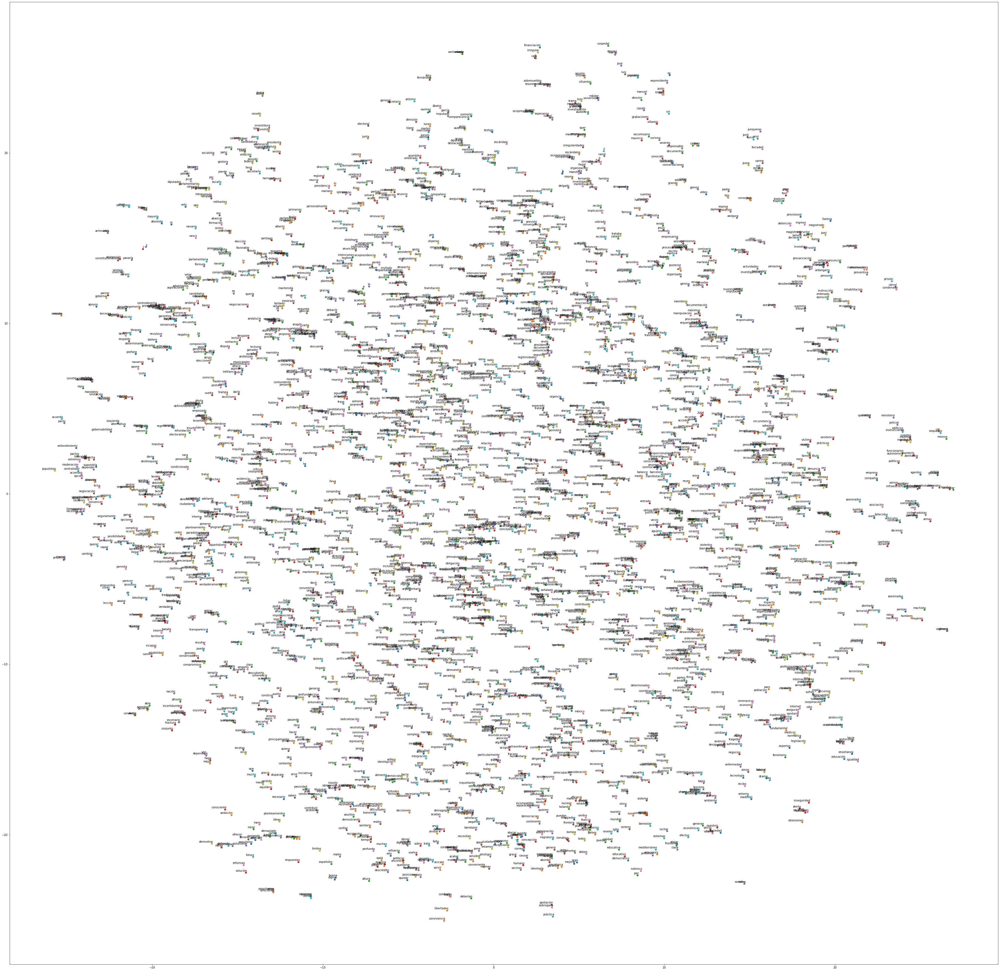

In [33]:
tsne_plot(news2vec, params)

## Visualizando el modelo en 2D con PCA

In [0]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

In [35]:
labels = []
tokens = []

for word in news2vec.wv.vocab:
    tokens.append(news2vec[word])
    labels.append(word)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """


In [0]:
tokens_norm = (tokens - np.mean(tokens))/np.sqrt(np.var(tokens))

In [0]:
pca_vals = pca.fit_transform(tokens_norm)

In [38]:
print(pca.explained_variance_ratio_)

[0.23756152 0.19533347]


Vemos que está explicado el 23,50% + 19,82% = 43,33% de la variación en solo dos dimensiones. Esto nos dice que hemos perdido la mitad de información sobre la variación pasando de 256 a 2 dimensiones.

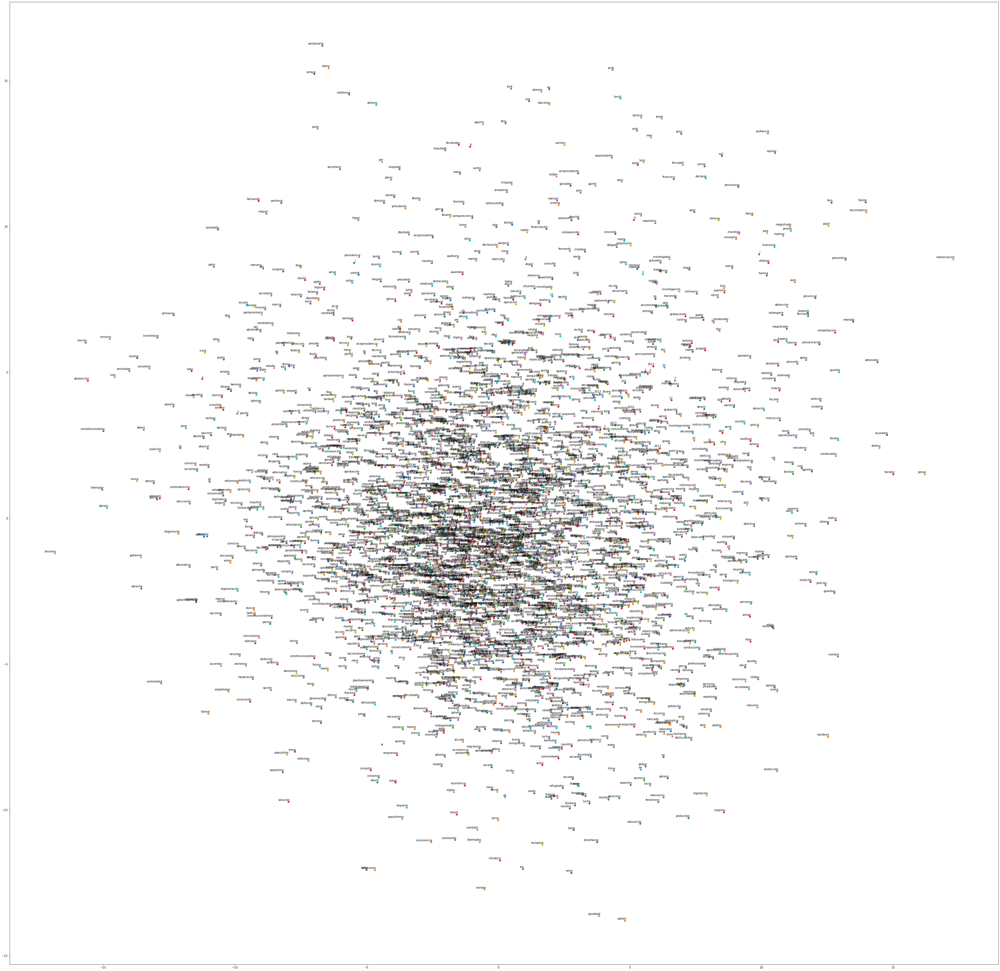

In [39]:
# Plot del PCA
x = []
y = []
for value in pca_vals:
    x.append(value[0])
    y.append(value[1])
    
plt.figure(figsize=(64, 64)) 
for i in range(len(x)):
    plt.scatter(x[i],y[i])
    plt.annotate(labels[i],
                  xy = (x[i], y[i]),
                  xytext = (5, 2),
                  textcoords = 'offset points',
                  ha = 'right',
                  va = 'bottom')
plt.show()

El plot del *Principal Component Analysis* nos muestra la combinación lineal que explica la mayor cantidad de varianción en los datos.

## Visualizando el modelo en 2D con UMAP

In [0]:
import umap
reducer = umap.UMAP(n_neighbors=15,
                    min_dist=0.01,
                    metric='euclidean',
                    n_epochs=2000,
                    random_state=42,
                    verbose=True)

In [48]:
umap_embedding = reducer.fit_transform(tokens_norm)
umap_embedding.shape

UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
     learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
     metric_kwds=None, min_dist=0.01, n_components=2, n_epochs=2000,
     n_neighbors=15, negative_sample_rate=5, random_state=42,
     repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
     target_metric='categorical', target_metric_kwds=None,
     target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
     transform_seed=42, verbose=True)
Construct fuzzy simplicial set
Sun Mar 22 12:19:18 2020 Finding Nearest Neighbors
Sun Mar 22 12:19:19 2020 Finished Nearest Neighbor Search
Sun Mar 22 12:19:19 2020 Construct embedding
	completed  0  /  2000 epochs
	completed  200  /  2000 epochs
	completed  400  /  2000 epochs
	completed  600  /  2000 epochs
	completed  800  /  2000 epochs
	completed  1000  /  2000 epochs
	completed  1200  /  2000 epochs
	completed  1400  /  2000 epochs
	completed  1600  /  2000 epochs
	completed  1800  /  2000 epoc

(4016, 2)

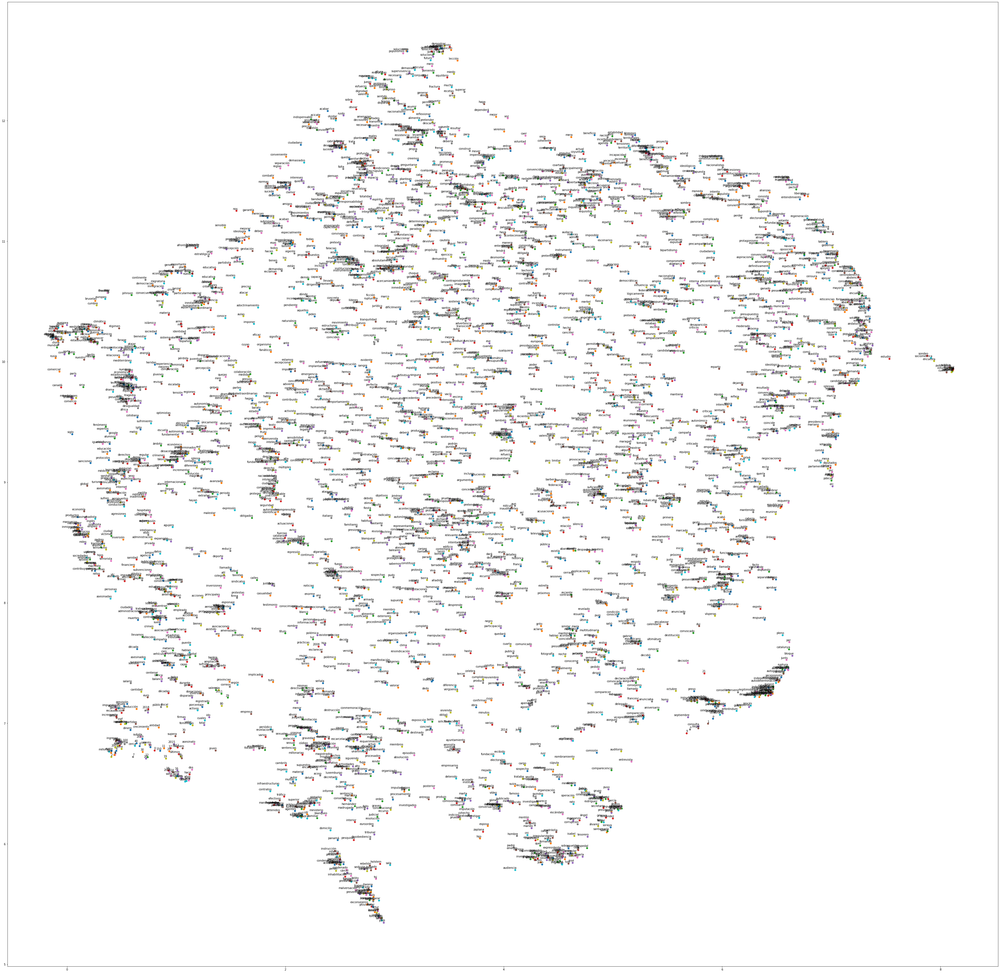

In [49]:
# Plot del UMAP
x = []
y = []
for value in umap_embedding:
    x.append(value[0])
    y.append(value[1])
    
plt.figure(figsize=(64, 64)) 
for i in range(len(x)):
    plt.scatter(x[i],y[i])
    plt.annotate(labels[i],
                  xy = (x[i], y[i]),
                  xytext = (5, 2),
                  textcoords = 'offset points',
                  ha = 'right',
                  va = 'bottom')
plt.show()

Del plot del UMAP podemos ver muchas cosas, así que iremos parte por parte.

### Análisis global

Podemos ver que en el UMAP, los datos tienen un sentido global. Es decir, podemos ver en el norte palabras relacionadas en notícias internacionales. En el sur, vemos palabras involucrando crímenes, corrupción y prisión. En la derecha palabras sobre gobiernabilidad, ideologías y partidos políticos. Finalmente, en la izquierda vemos las palabras más numéricas de notícias involucrando datos. 

### Análisis local

Podemos ver diferentes aglomeraciones en las cuáles se tratan palabras sobre Cataluña, corrupción, el gobierno, notícias internacionales y presos políticos.

Estas aglomeraciones pintan muy bien una fotografía de qué tipo de notícias salen en el diario. 